##  $$\color{blue}{\text{MIT 2.131 Hammerstein Nonlinear System ID: Cuber}} $$

#### <center> Ian Hunter, 25 April 2023

Version Notes:   
- 18 Apr 2022 started
- 20 Apr 2022 Added better deconvolution method (Wiener deconvolution)
- 20 Apr 2023 Updated
- 24 Apr 2023 Added parametric model fit

#### Objectives

The purpose of these notes is to define Hammerstein systems and introduce techniques which under certain circumstances enables Hammerstein systems to be characterized experimentally.

#### Hammerstein Systems

A static nonlinearity (e.g., cuber, hard limiter, etc) followed by a linear dynamic subsystem is called a Hammerstein system after the German mathematician Adolf Hammerstein (if you can read German see https://de.wikipedia.org/wiki/Adolf_Hammerstein) who studied such systems.

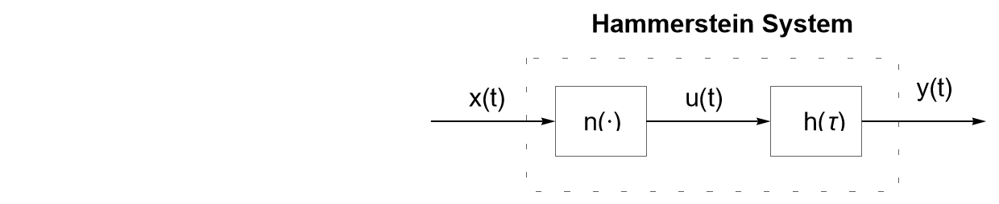

Here we see a Hammerstein system consisting of a static nonlinear element, $n(\centerdot)$, followed by a linear dynamic subsystem as represented by an impulse response function, $h(\tau)$. The input to the Hammerstein system is denoted by, x(t), and the output from the Hammerstein system is denoted by, $y(t)$. An internal signal $u(t)$ is the output from the  static nonlinear element, $n(\centerdot)$, and is also the input to the linear dynamic component, $h(\tau)$.

Sometimes Hammerstein systems are called NL systems because there is a static nonlinearity (N) followed by a linear dynamic system (L). An LN system consists of a  linear dynamic element (L) followed by a nonlinear static element (N) and is called a Wiener system. Wiener system identification is the subject of another JupyterLab Notebook.

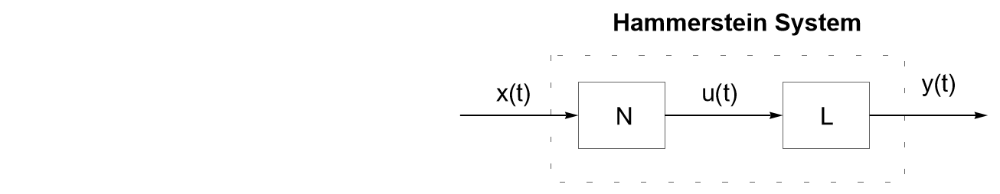

In these notes we will simulate a Hammerstein system and attempt to discover $n(\centerdot)$ and $h(\tau)$, purely from the input, $x(t)$, and output, $y(t)$, data sets.

#### Import libraries

We will use the Python plotting library, matplotlib, as well as the library of numeric math functions, numpy, and the library of scientific numerical algorithms, scipy.

In [3]:
import numpy as np # works with complex but one of the arguments must be complex
from numpy import loadtxt
import matplotlib.pyplot as plt
from scipy import signal
from scipy import interpolate
from scipy.linalg import toeplitz, solve_toeplitz
from scipy.optimize import curve_fit
from numpy.polynomial.polynomial import polyfit
from numpy.fft import fft, ifft, ifftshift
import csv # this gives us tools to manipulate CSV files
%matplotlib inline
%config InlineBackend.figure_format = 'svg' # this is key to improving plot resolution

#### Create Hammerstein system

Lets choose a second-order low-pass  subsystem. The general  transfer function  for such a  sub system is :

$$ \large H(s)=\frac{\alpha.{\omega_n}^2}{s^2+2.\zeta.\omega_n.s+{\omega_n}^2} $$

If we inverse Laplace transform this transfer function then we get the impulse response function:

$$ \large h(\tau)=\frac{e^{-\tau.\zeta.\omega_n}.\alpha .\omega_n .sinh\bigl(\tau.\sqrt{{\zeta}^2-1}.\omega_n\bigr)}{\sqrt{{\zeta}^2-1}} $$

where $\alpha $ is the static gain, $\omega$ is the natural frequency in rad/s and $\zeta$ is the damping parameter.

The Python code to implement this second-order impulse response function (IRF) is: 

In [62]:
def irf2(tau,a,w,z): # 2nd order impulse response function
    # where a is the static gain
    #       w is the natural frequency in rad/s
    #       z is the dampling parameter
    # note that complex is required to force np.sqrt to return a complex number
    c=np.sqrt(complex(z**2-1.0))
    return np.real((np.exp(-tau*z*w)*a*w*np.sinh(tau*c*w))/c)

Lets make the static gain, $\alpha=1$, the natural frequency, $\omega_n=2.\pi.10$ (radians/s) = $10 Hz$, and the damping parameter, $\zeta=0.4$ :

In [63]:
a=1
w=2*np.pi*10
z=0.4

We need a sampled version of this IRF. So lets make the sampling rate 2 kHz (i.e., sampling increment, dt, 0.5 ms) and impulse response function length of a little over 0.5 second:

In [64]:
dt=0.0005 # 0.5 ms
mi=1024
tau=np.arange(0,dt*mi,dt)

In [65]:
h=irf2(tau,a,w,z)

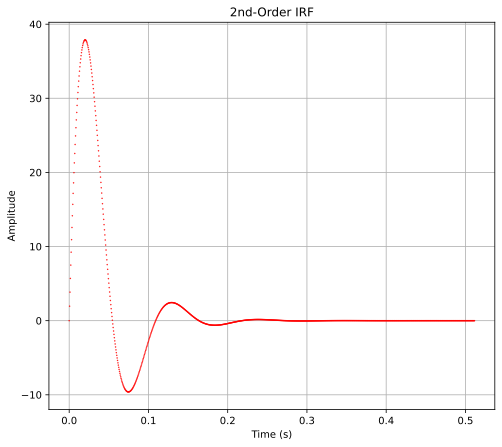

In [66]:
plt.rcParams['figure.figsize'] = [8, 7]
plt.plot(tau, h, 'r.',markersize=1)
plt.title('2nd-Order IRF')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid()
plt.show()

It is always a good idea to plot the individual points in the impulse response function to check that the sampling rate is high enough given the time course of the function. It is best to have plenty of points (e.g., > 10) covering the initial rise of the impulse response function. It is also best to have a domain whose duration (last value) is 1.5 x to 2 x the time it takes for the impulse response to "die out". If these conditions are not met then resample the original continuous (symbolic) impulse response function with a more appropriate sampling interval, dt.

We can check (via trapezoidal integration) to see if the area under this sampled IRF equals the static gain, $\alpha$:

In [67]:
np.trapz(h,tau)

0.9999197996648457

This is close enough.

#### Cuber static nonlinearity, $n(\centerdot)$

In these notes we will make the Hammerstein system static nonlinearity a cuber with an offset of c[0]=1 and a cube term scaling factor of c[3]=0.2:

In [68]:
def n(x,c):  # c[0] + c[1]*u + c[2]*u**2 + c[3]*u**3 + ....+ c[i]*x**i
    i=0
    sum=0
    while i<len(c):
        sum=sum+c[i]*x**i
        i=i+1
    return sum

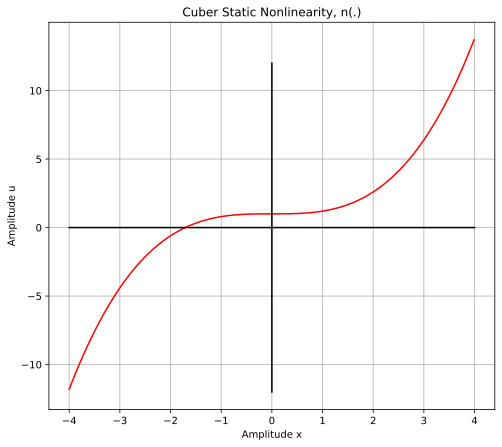

In [69]:
plt.rcParams['figure.figsize'] = [8, 7]
xx=np.arange(-4,4,0.01)
plt.plot(xx,n(xx,[1,0,0,0.2]), 'r',markersize=1)
plt.plot([-4,4],[0,0],'k')
plt.plot([-0,0],[-12,12],'k')
plt.title('Cuber Static Nonlinearity, n(.)')
plt.xlabel('Amplitude x')
plt.ylabel('Amplitude u')
plt.grid()
plt.show()

#### Generate Gaussian white noise signal, x(t)

We start by generating a little over 65 seconds of a Gaussian white noise input, $x(t)$, with a mean of 0 and a standard deviation of 1. Note that we could have used pretty much any stochastic input here except a stochastic binary input (which is not sufficient to identify a nonlinear system). 

In [70]:
ni=2**17 # number of input samples
t=np.arange(0,ni*dt,dt)

In [71]:
x=np.random.randn(ni) # Gaussian numbers

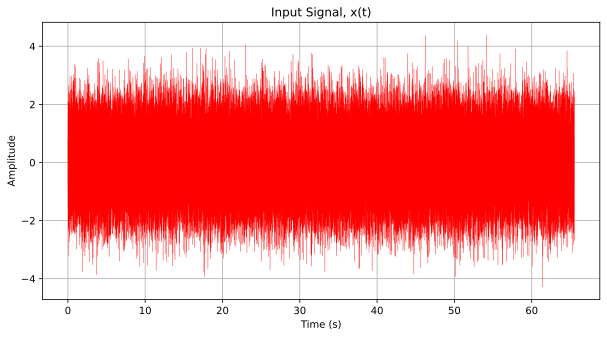

In [72]:
plt.rcParams['figure.figsize'] = [10, 5]
plt.plot(t, x, 'r',linewidth=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Input Signal, x(t)')
plt.grid()
plt.show()

#### Pass Input Through the Cuber Static Nonlinearity

We now pass $x(t)$ through our static nonlinearity,  $n(\centerdot)$, to produce an internal signal we call $u(t)$:

In [73]:
u=n(x,[1,0,0,0.2])

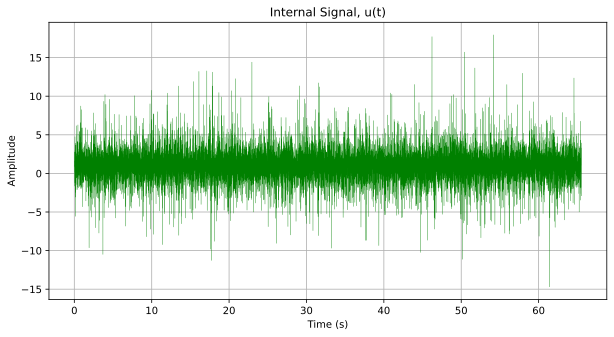

In [74]:
plt.rcParams['figure.figsize'] = [10, 5]
plt.plot(t, u, 'g',linewidth=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Internal Signal, u(t)')
plt.grid()
plt.show()


Lets zoom in:

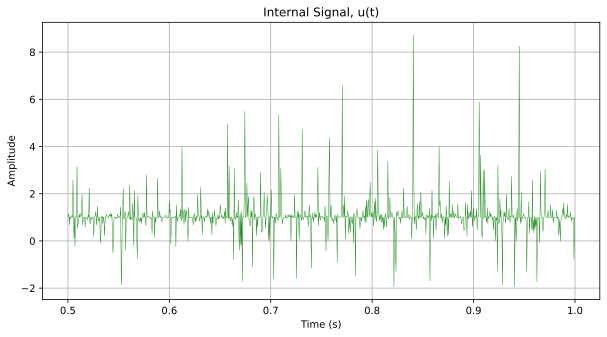

In [75]:
plt.rcParams['figure.figsize'] = [10, 5]
plt.plot(t[1000:2000], u[1000:2000], 'g',linewidth=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Internal Signal, u(t)')
plt.grid()
plt.show()


#### Convolve, $h(\tau)$, with $u(t)$ to produce output, $y(t)$

We now numerically convolve our internal signal, $u(t)$, with the impulse response function, $h(\tau)$, to generate an output to which we add 5% measurement noise, $e(t)$, to produce the output signal, $y(t)$:

In [76]:
y=dt*np.convolve(u,h)[0:ni] # need just the first ni values
#yvar=np.var(yy)
#evar=np.var(np.random.randn(ni))
#y=yy+(0.1*yvar/evar)*np.random.randn(ni) # add 10% Gaussian white measurement noise
#y=yy

In [4]:
xtemp = loadtxt('2.131 DMA Data/Gaussian/Dgauss-1730.csv', delimiter=',',usecols = (1))
ytemp = loadtxt('2.131 DMA Data/Gaussian/Fgauss-1730.csv', delimiter=',',usecols = (1))


#if ytemp.size > xtemp.size:
#    y = ytemp[:(xtemp.size)]
#    x = xtemp
#    u = utemp
#else:
#    x = xtemp[:(ytemp.size)]
#    u = utemp[:(ytemp.size)]
#    y = ytemp
x = xtemp[1016:100500]
y = ytemp[1016:100500]
    
t = np.linspace(0,y.size*0.012,num=y.size)
print(t[-1])
print(y.size)

FileNotFoundError: 2.131 DMA Data/Gaussian/Dgauss-1730.csv not found.

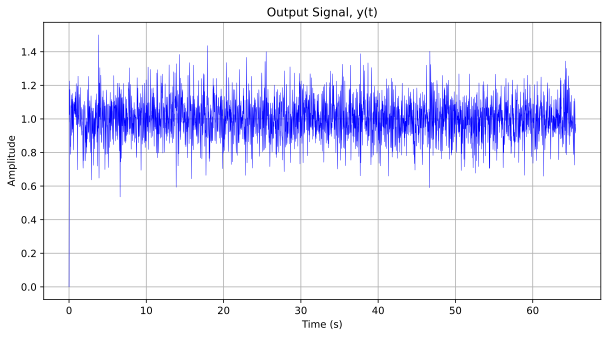

In [ ]:
plt.rcParams['figure.figsize'] = [10, 5]
plt.plot(t, y, 'b',linewidth=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Output Signal, y(t)')
plt.grid()
plt.show()


Notice that the output has a non-zero mean.

#### Compare input and output probability density functions 

We now calculate the input and output probability density functions:

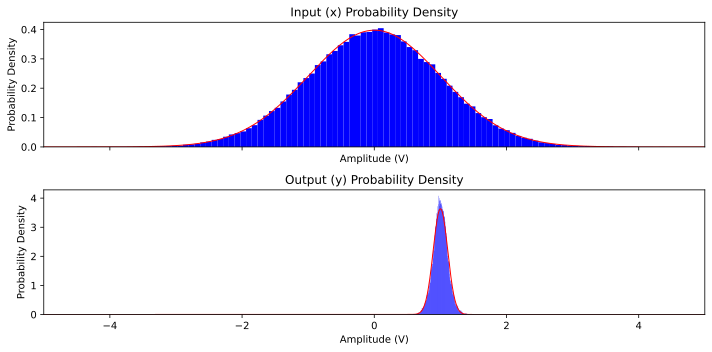

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, sharex=True) 
plt.rcParams['figure.figsize'] = [8, 8]
xmean=np.mean(x)
xsd=np.std(x)
ampl=np.arange(-10,10,0.01)
xpdf=np.exp(-0.5*((ampl-xmean)/xsd)**2)/(xsd*np.sqrt(2*np.pi))
ax1.plot(ampl,xpdf, 'r',linewidth=1)
ax1.hist(x, density=True, bins=100, color='b') 
ax1.set(xlabel='Amplitude (V)', ylabel='Probability Density', title='Input (x) Probability Density')
#ax1.grid()
ymean=np.mean(y)
ysd=np.std(y)
ampl=np.arange(-10,10,0.01)
ypdf=np.exp(-0.5*((ampl-ymean)/ysd)**2)/(ysd*np.sqrt(2*np.pi))
ax2.plot(ampl,ypdf, 'r',linewidth=1)
ax2.hist(y, density=True, bins=400, color='b')
ax2.set(xlabel='Amplitude (V)', ylabel='Probability Density', title='Output (y) Probability Density')
#ax2.grid()
plt.tight_layout()
plt.xlim([-5,5])
plt.show()
plt.clf()
plt.close()

The output, $y(t)$, is somewhat Gaussian but with a non-zero mean.

A linear system perturbed by a Gaussian stochastic input (does not need to be white) will produce a Gaussian stochastic output. If the output from a system driven by a Gaussian stochastic input is non Gaussian then this is clear evidence that the system is nonlinear.

#### Hammerstein System Identification

We now ask if it is possible to determine the two internal subsystems, namely, $h(\tau)$ and $n(\centerdot)$ solely from the input, $x(t)$, and output, $y(t)$, signals.
Lets see what happens when we compute the nonparametric impulse response function, $h1(\tau)$, between the input, $x(t)$, and the output, $y(t)$. 

As detailed in previous notes we can determine the system impulse response function from estimates of the input auto-correlation and input output cross-correlation functions via Toeplitz matrix inversion:

In [ ]:
cxx=dt*signal.correlate(x-np.mean(x),x-np.mean(x),mode='same',method='auto')[round(ni/2):round(ni/2)+mi] # x auto-correlation
cyx=dt*signal.correlate(y-np.mean(y),x-np.mean(x),mode='same',method='auto')[round(ni/2):round(ni/2)+mi] # xy cross-correlation
#toe=toeplitz(cxx)
h1=solve_toeplitz(cxx,cyx)/dt

Note that we removed the mean from both x and y in calculating cxx and cyx.

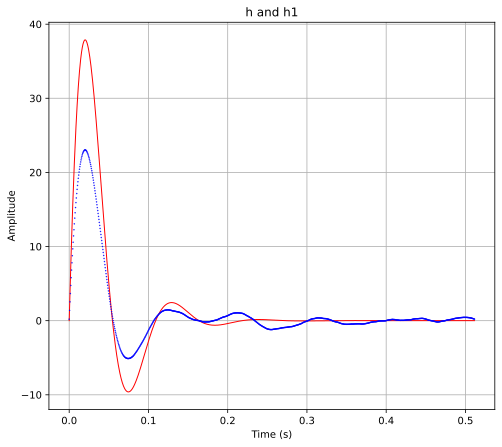

In [ ]:
plt.rcParams['figure.figsize'] = [8, 7]
plt.plot(tau, h, 'r',linewidth=1)
plt.plot(tau, h1, 'b.',markersize=1)
plt.title('h and h1')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid()
plt.show()

If we multiply $h(\tau)$ by $\beta$ and divide  $n(\centerdot)$ by $\beta$ there will be no change in the output, $y(t)$. In other words there is a scaling constant, $\beta$ , that can freely move from $h(\tau)$ to $n(\centerdot)$. So lets scale $h(\tau)$ and $h1(\tau)$ so that the area under them is 1 and replot:

In [ ]:
h1=h1/np.trapz(h1,tau)
np.trapz(h1,tau)

1.0

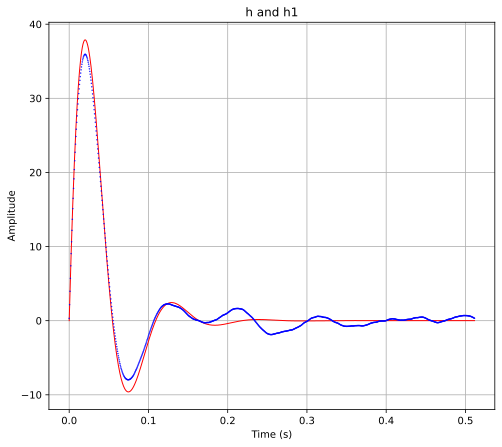

In [ ]:
plt.rcParams['figure.figsize'] = [8, 7]
plt.plot(tau, h/np.trapz(h,tau), 'r',linewidth=1)
plt.plot(tau, h1, 'b.',markersize=1)
plt.title('h and h1')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid()
plt.show()

This is a remarkable result!! It shows that despite the presence of a major static nonlinearity such as a cuber, the stochastic system identification techniques were able to nevertheless get an estimate of the Hammerstein system's dynamic linear element. This amazing result (for the case of cross-correlation) seems to have been first discovered by Julian Bussgang (https://en.wikipedia.org/wiki/Julian_J._Bussgang) in 1951 during his Master's thesis research when he was a student at the Research Lab for Electronics (RLE) at MIT (https://en.wikipedia.org/wiki/Bussgang_theorem).

#### Predict $y(t)$

Now that we have $h1(\tau)$, we can convolve with the input, $x(t)$, to predict the output, $y1(t)$:

In [ ]:
y1=dt*np.convolve(x,h1)[0:ni] # need just the first ni values

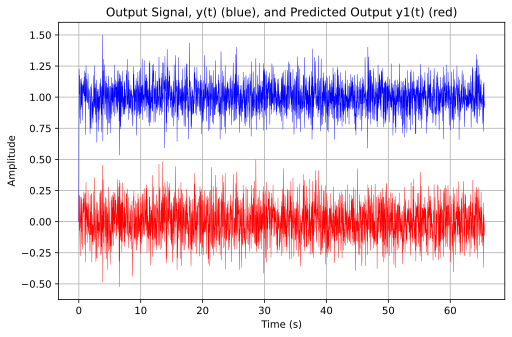

In [ ]:
plt.rcParams['figure.figsize'] = [8, 5]
plt.plot(t, y, 'b',linewidth=0.4)
plt.plot(t, y1, 'r',linewidth=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Output Signal, y(t) (blue), and Predicted Output y1(t) (red)')
plt.grid()
plt.show()

Clearly we have failed to predict the non-zero mean of the output. Lets compute the residuals:

In [ ]:
r1=y-y1

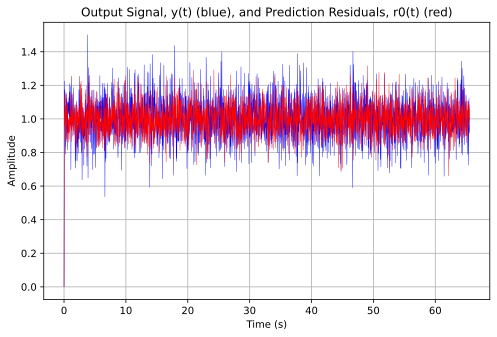

In [ ]:
plt.rcParams['figure.figsize'] = [8, 5]
plt.plot(t, y, 'b',linewidth=0.4)
plt.plot(t, r1, 'r',linewidth=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Output Signal, y(t) (blue), and Prediction Residuals, r0(t) (red)')
plt.grid()
plt.show()

In [ ]:
VAF1=100.0*(1-np.var(r1)/np.var(y))
VAF1

41.767541873457816

This is a low variance accounted for (VAF) and unless we think that much of the output is corrupted with additive noise, we should continue our analysis and consider a nonlinear model. 

#### Predict u(t) from y(t) via Wiener Deconvolution

Now that we have $h1(\tau)$, we can convolve its dynamic inverse with the output, $y(t)$, to produce a prediction of the internal signal, $u(t)$. Another name for this is deconvolution and we say that $h1(\tau)$ is deconvolved from $y(t)$ to produce $u1(t)$. We could implement deconvolution using the scipy deconvolve function but it is prone to terrible numerical instabilities for any thing except very short impulse response functions. A more numerically stable algorithm for deconvolution is called Wiener deconvolution and can be implemented as follows:

In [ ]:
def wiener_deconvolution(x, h, invsnr):
    # invsnr is the inverse signal to noise ratio (SNR)
    H=fft(np.concatenate((h, np.zeros(len(x)-len(h)))))
    return np.real(ifft(fft(x)*np.conj(H)/(H*np.conj(H)+invsnr**2)))

In [ ]:
u1=wiener_deconvolution(y,h1,1e-3)/dt

#### Predict  \$n1(\centerdot)$

Now that we have an estimate of $u(t)$, we can cross-plot $u1(t)$ vs $x(t)$ to see the form of the nonlinearity (if any):

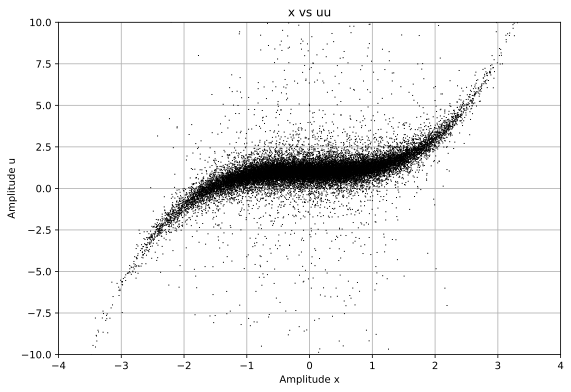

In [ ]:
plt.rcParams['figure.figsize'] = [9, 6]
plt.plot(x[::5], u1[::5], 'k,')
plt.title('x vs uu')
plt.xlabel('Amplitude x')
plt.ylabel('Amplitude u')
plt.xlim([-4,4])
plt.ylim([-10,10])
plt.grid()
plt.show()

This is clearly not a straight line and immediately suggests that at the very least we have Hammerstein system (i.e., NL system). 

We can find an approximation to the estimate, $n1(\centerdot)$, of $n(\centerdot)$ above by fitting a high-order polynomial to the $u1(t)$ vs $x(t)$ cross-plot. We are using the polynomial here as a type of nonparametric function approximation.

We will use the polyfit() function in numpy below. There is also a similar function in scipy also called polyfit. Note that there is a difference in the order of coefficients returned from the two methods:

scipy polyfit returns the coefficients in descending order of degree, whereas 

numpy polyfit returns the coefficients, called c here, in ascending order of degree.

Note that numpy polyfit allows for specification of the particular co-efficients to be fitted:

In [ ]:
c1=np.polynomial.polynomial.polyfit(x,u1,deg=[0,1,2,3,4,5,6,7,8,9],full=False)

Lets plot this estimate,  $n1(\centerdot)$, of the nonlinearity (red) together with the cross-plot of $u1(t)$ vs $x(t)$ (black):

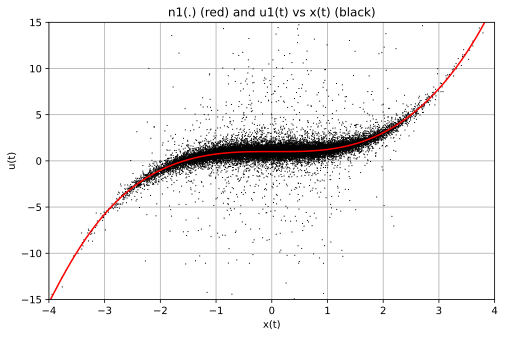

In [ ]:
xx=np.arange(np.min(x),np.max(x),0.01)
plt.rcParams['figure.figsize'] = [8, 5]
plt.plot(x[::5], u1[::5], 'k,')
plt.plot(xx, n(xx,c1), 'r',markersize=1)
plt.xlabel('x(t)')
plt.ylabel('u(t)')
plt.title('n1(.) (red) and u1(t) vs x(t) (black)')
plt.xlim([-4,4])
plt.ylim([-15,15])
plt.grid()
plt.show()

So as we can see our estimate of the Wiener system static nonlinearity,  $n1(\centerdot)$,  is close to the actual static nonlinear element,  $n(\centerdot)$ except perhaps for the scaling constant we mentioned before.

#### Predict Internal Signal, $u2(t)$

Now that we have the estimate,  $n1(\centerdot)$, we can predict the internal signal, $u2(t)$:

In [ ]:
u2=n(x,c1)

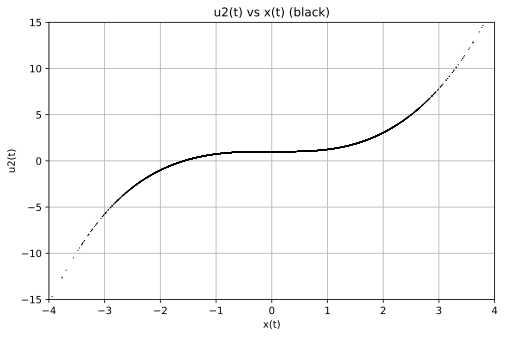

In [ ]:
xx=np.arange(np.min(x),np.max(x),0.01)
plt.rcParams['figure.figsize'] = [8, 5]
plt.plot(x[::5], u2[::5], 'k,')
#plt.plot(xx, n(xx,c1), 'r',markersize=1)
plt.xlabel('x(t)')
plt.ylabel('u2(t)')
plt.title('u2(t) vs x(t) (black)')
plt.xlim([-4,4])
plt.ylim([-15,15])
plt.grid()
plt.show()

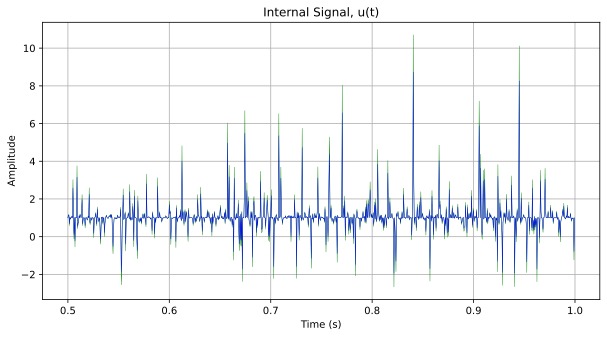

In [ ]:
plt.rcParams['figure.figsize'] = [10, 5]
plt.plot(t[1000:2000], u2[1000:2000], 'g',linewidth=0.4)
plt.plot(t[1000:2000], u[1000:2000], 'b',linewidth=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Internal Signal, u(t)')
plt.grid()
plt.show()


#### Redetermine the Impulse Response Function

Now that we have an estimate of the internal signal, $u2(t)$, we redetermine the impulse response function, $h2(\tau)$:

In [ ]:
cuu=dt*signal.correlate(u2-np.mean(u2),u2-np.mean(u2),mode='same',method='auto')[round(ni/2):round(ni/2)+mi] # u auto-correlation
cyu=dt*signal.correlate(y-np.mean(y),u2-np.mean(u2),mode='same',method='auto')[round(ni/2):round(ni/2)+mi] # uy cross-correlation
#toe=toeplitz(cuu)
h2=solve_toeplitz(cuu,cyu)/dt

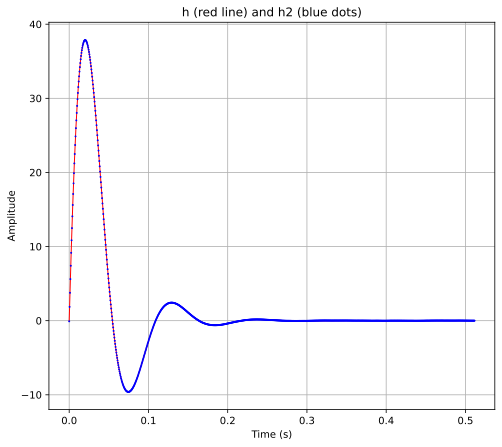

In [ ]:
plt.rcParams['figure.figsize'] = [8, 7]
plt.plot(tau, h/np.trapz(h,tau), 'r',linewidth=1)
plt.plot(tau, h2/np.trapz(h2,tau), 'b.',markersize=2)
plt.title('h (red line) and h2 (blue dots)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid()
plt.show()

Clearly we have almost exactly found the Hammerstein system impulse response function (to within a scaling parameter as mentioned previously).

#### Re-Predict the Output

Now that we have the impulse response function we can re-predict the output, $y2(t)$:

In [ ]:
y2=dt*np.convolve(u2,h2/np.trapz(h2,tau))[0:ni] # need just the first ni values

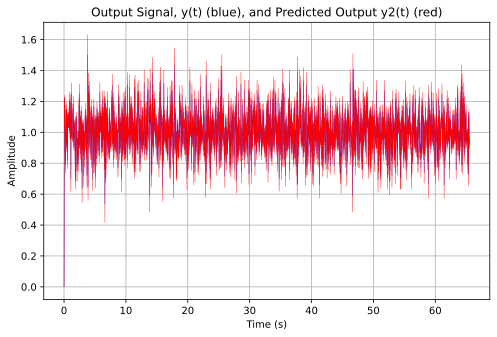

In [ ]:
plt.rcParams['figure.figsize'] = [8, 5]
plt.plot(t, y, 'b',linewidth=0.4)
plt.plot(t, y2, 'r',linewidth=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Output Signal, y(t) (blue), and Predicted Output y2(t) (red)')
plt.grid()
plt.show()

Clearly we have now predicted the non-zero mean of the output. Lets compute the residuals:

In [ ]:
r2=y-y2

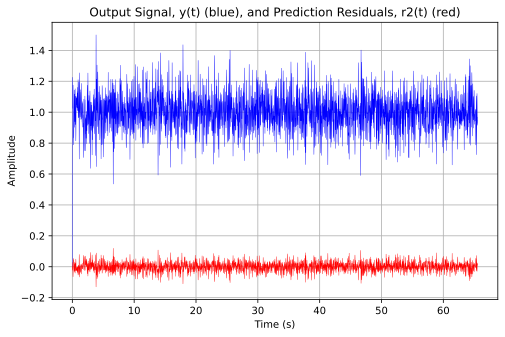

In [ ]:
plt.rcParams['figure.figsize'] = [8, 5]
plt.plot(t, y, 'b',linewidth=0.4)
plt.plot(t, r2, 'r',linewidth=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Output Signal, y(t) (blue), and Prediction Residuals, r2(t) (red)')
plt.grid()
plt.show()

In [ ]:
VAF2=100.0*(1-np.var(r2)/np.var(y))
VAF2

93.29323099153923

Note that the VAF is now over 90%! At this point we will stop because the VAF is so high. However if the VAF was not so high we could continue the process by going back and forward through the system one or more times.

#### Parametric Hammerstein Model Fit

Now that we have found that a nonparametric Hammerstein model fits well we can now fit a parametric model. We could fit a model to the linear dynamic subsystem and then separately fit a model to the static nonlinear subsystem. However it is best if we can fit both at the same time using the original input and output data:

We start by defining a parametric Hammerstein model with a cubic with offset static nonlinearity and a second-order, low-pass, second order linear dynamic subsystem:

In [ ]:
def NLmodel(x,a0,a1,c0,c3):
    # note that the impulse response function in the b,a (numerator, denominator) form works best
    uu=c0+c3*x**3
    tt,hh=signal.impulse2(([a0],[1.0,a1,a0]),T=tau) # second order order model
    return dt*signal.convolve(uu,hh)[0:len(uu)]

And then, after specifiying some initial parameter guesses, we use the Levenberg-Marquardt algorithm to find the "best fit" (least squares) parameter estimates for the 2 parameters of the nonlinear static nonlinearity and the two parameters of the linear dynamic model (remember that the third linear dynamic parameter (i.e., static gain) is not independent of the static nonlinearity scaling):

In [ ]:
cc0=1  # initial parameter estimates
cc3=0.2 
aa0=4000 
aa1=45

In [ ]:
popt, pcov = curve_fit(NLmodel, x, y, p0=[aa0,aa1,cc0,cc3], method='lm') # p0 are the initial parameter estimates
[aa0,aa1,cc0,cc3]=popt

Note that unfortunately we need to start with parameter estimates (particularly a1 (see below)) close to the original values. This is undesirable and we would prefer to start with parameter guess values which can be way off.

In [ ]:
# Original parameter values used in the Hammerstein model simulation
a0=(2*np.pi*10)**2
a1=2*0.4*2*np.pi*10
c0=1
c3=0.2
[a0,a1,c0,c3]

[3947.8417604357433, 50.26548245743669, 1, 0.2]

In [ ]:
[aa0,aa1,cc0,cc3]

[3947.7418149582886, 50.2603152794784, 1.0000003363450016, 0.19999226671135836]

Note that our parameter estimates [aa0,aa1,cc0,cc3] are almost identical to our original parameters [a0,a1,c0,c3]

#### Variance Accounted for by the Estimated Parametric Hammerstein Model

In [ ]:
def NLmodelVAF(a0,a1,c0,c3):
    yp=NLmodel(x,a0,a1,c0,c3)
    rr=y-yp
    return 100.0*(1-np.var(rr)/np.var(y))

In [ ]:
NLmodelVAF(aa0,aa1,cc0,cc3)

99.99999979596596

Almost perfect discovery of original parameter values!

#### Sensitivity Functions

The minimization technique used above requires initial parameter guesses to be fairly close to there eventual "best" estimated values. Lets look at the parameter sensitivity functions to see which parameters contribute most to the fit:

##### Parameter a0

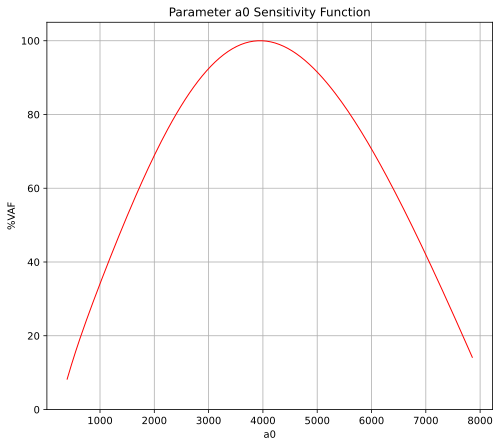

In [ ]:
aa0=np.arange(0.1*a0,2*a0,0.01*a0)
vaf=np.zeros(len(aa0))
i=0
while i<len(aa0):
    vaf[i]=NLmodelVAF(aa0[i],a1,c0,c3)
    i=i+1
plt.rcParams['figure.figsize'] = [8, 7]
plt.plot(aa0,vaf, 'r',linewidth=1)
plt.title('Parameter a0 Sensitivity Function')
plt.xlabel('a0')
plt.ylabel('%VAF')
plt.ylim([0,105])
plt.grid()
plt.show()

##### Parameter a1

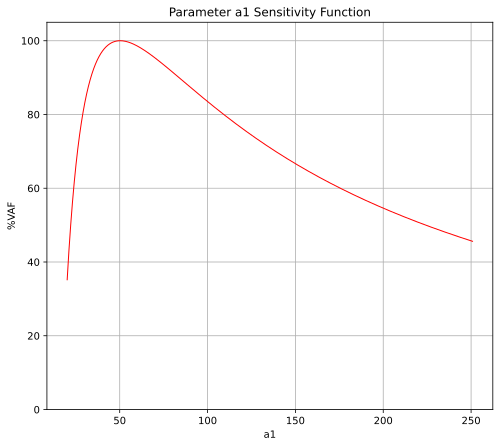

In [ ]:
aa1=np.arange(0.4*a1,5*a1,0.01*a1)
vaf=np.zeros(len(aa1))
i=0
while i<len(aa1):
    vaf[i]=NLmodelVAF(a0,aa1[i],c0,c3)
    i=i+1
plt.rcParams['figure.figsize'] = [8, 7]
plt.plot(aa1,vaf, 'r',linewidth=1)
plt.title('Parameter a1 Sensitivity Function')
plt.xlabel('a1')
plt.ylabel('%VAF')
plt.ylim([0,105])
plt.grid()
plt.show()

Note that the a1 parameter has a large effect on the VAF. This may explain why its initial guess for the nonlinear minimization technique needs to be rather close to the original value. The nonlinear minimization technique (Levenberg-Marquardt algorithm) must get stuck in a local minimum when the a1 parameter initial guess is too far off the optimal value.

##### Parameter c0

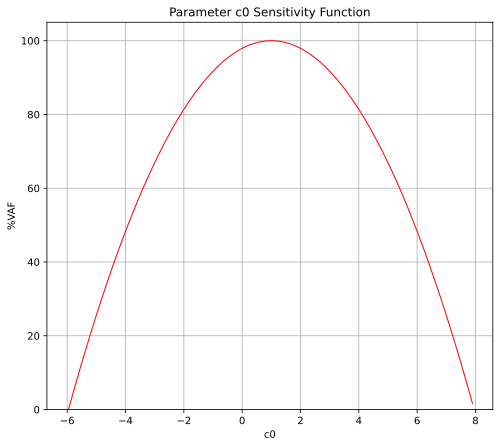

In [ ]:
cc0=np.arange(-6,8,0.1*c0)
vaf=np.zeros(len(cc0))
i=0
while i<len(cc0):
    vaf[i]=NLmodelVAF(a0,a1,cc0[i],c3)
    i=i+1
plt.rcParams['figure.figsize'] = [8, 7]
plt.plot(cc0,vaf, 'r',linewidth=1)
plt.title('Parameter c0 Sensitivity Function')
plt.xlabel('c0')
plt.ylabel('%VAF')
plt.ylim([0,105])
plt.grid()
plt.show()

##### Parameter c3

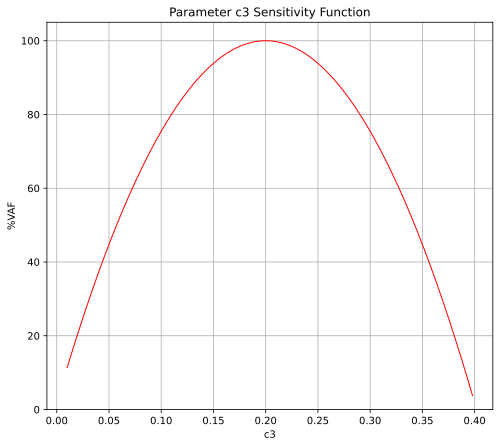

In [ ]:
cc3=np.arange(0.05*c3,2*c3,0.01*c3)
vaf=np.zeros(len(cc3))
i=0
while i<len(cc3):
    vaf[i]=NLmodelVAF(a0,a1,c0,cc3[i])
    i=i+1
plt.rcParams['figure.figsize'] = [8, 7]
plt.plot(cc3,vaf, 'r',linewidth=1)
plt.title('Parameter c3 Sensitivity Function')
plt.xlabel('c3')
plt.ylabel('%VAF')
plt.ylim([0,105])
plt.grid()
plt.show()